# Import 

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import pickle
import glob
import math
from scipy import ndimage
# from scipy.ndimage.interpolation import rotate
# from PIL import Image
%matplotlib inline

import tools
import structure

# PrePare

In [2]:
# Prepare variables
V = tools.Vars()
# V.put('data_dir', os.getcwd() + "/../full_data_cell/")
# V.put('data_dir', os.getcwd() + "/../full_data_cell_bgrm/")
V.put('data_dir', "/root/data/cell_unscale")
V.put('cell_xy_file', "/root/data/cell_unscale/cell_xy.p")
V.put('cell_x', 140)
V.put('cell_y', 280)
V.put('test_set_size', 4096)
V.put('batch_size', 64)
V.put('learning_rate', 0.001)
V.put('training_iters', 200000)
V.put('display_step', 150)
V.put('save_step', 3000)
V.put('do_l2', False)
V.put('l2_rate', 0.0001)
V.put('boardDir', "./board")
V.put('expTag', "AttentionCNN_Cell")
V.put('expName', "16.32.64.128.512.512_e001_AttFc2")
V.put('model_save_path', "./model/{}/{}".format(V.get('expTag'), V.get('expName')))

In [3]:
# def load_data(V, rm_list, x_grid_std, y_grid_std) :
#     # load Data
#     data_dir = V.get('data_dir')
#     cell_xy_file = V.get('cell_xy_file')
#     cats = os.listdir(data_dir)
#     for c in cats :
#         if not filter(os.path.isdir, glob.glob("{}/{}".format(data_dir, c))) :
#              cats.remove(c)
#     for rm in rm_list :
#         cats.remove(rm)
#     # cats.remove("shchoi")
#     # cats.remove(".ipynb_checkpoints")
#     #     cats.remove("PASS") # exclude PASS label
#     #     cats.remove("NORMAL") # exclude NORAML label
#     # cats.remove("PI_UNDER_K") # file list aborted
#     cats = sorted(cats)
#     print "Classes :"
#     print cats

# #     x_grid_std = range(0,141,20)
# #     y_grid_std = range(0,281,20)
#     cell_xy = pickle.load(open(cell_xy_file, 'rb'))
#     fList = []
#     cList = []
#     xyList = []
#     cDic = { cats[i] : i for i in range(len(cats)) }
#     for c in cats :
#         fCat = os.listdir("{}/{}".format(data_dir, c))
#         fCat = sorted(fCat, key=str.lower)
#         f_check = fCat[0].split("_")[0]
#         f_arr = []
#         xy_arr = []
#         for f in fCat :
#             tokens = f.split("_")
#             if tokens[0] != f_check :
#                 f_check = tokens[0]
#                 fList.append(f_arr)
#                 xyList.append(xy_arr)
#                 cList.append(cDic[c])
#                 f_arr = []
#                 xy_arr = []
#             f_name = "{}/{}/{}".format(data_dir, c, f)
#             f_arr.append(f_name)
#             if f_name in cell_xy :
#                 xy = list(cell_xy[f_name])
# #                 for i in range(len(x_grid_std)-1) :
# #                     if x_grid_std[i] <= xy[1] < x_grid_std[i+1] :
# #                         xy[1] = i
# #                         break
# #                 for i in range(len(y_grid_std)-1) :
# #                     if y_grid_std[i] <= xy[0] < y_grid_std[i+1] :
# #                         xy[0] = i
# #                         break
#                 xy_arr.append(xy)
#         fList.append(f_arr)
#         cList.append(cDic[c])
#         xyList.append(xy_arr)

#     V.put('n_output', len(cDic))
#     print "# of class : {:d}".format(len(cDic))
#     print "# of images : {:d}".format(len(fList))
#     print "Loading Done"
#     return [fList, cList, xyList, cDic]

# def partition(V, fList, cList, xyList, cDic) :
#     test_set_size = V.get('test_set_size')
#     train_set_size = len(fList) - test_set_size
#     partitions = np.random.permutation(len(fList))
#     train_f_list = []
#     train_l_list = []
#     train_xy_list = []
#     for p in partitions[:train_set_size] :
#         train_f_list.extend(fList[p])
#         train_l_list.extend([cList[p] for i in range(len(fList[p]))])
#         train_xy_list.extend(xyList[p])
#     print "# of train cells : {:d}".format(len(train_f_list))
#     print "Train partition done"
#     test_f_list = []
#     test_labels = []
#     test_xys = []
#     for p in partitions[train_set_size:] :
#         test_f_list.append(fList[p])
#         test_labels.append(cList[p])
#         test_xys.append(xyList[p])
#     test_images = []
#     for fs in test_f_list :
#         imgs = []
#         for f in fs :
#             imgs.append(ndimage.imread(f))
#         test_images.append(np.array(imgs))
#     print "Test partition done"
#     return [train_f_list, train_l_list, train_xy_list, test_images, test_labels, test_xys]

# def oversampling(train_f_list, train_l_list, train_xy_list, cDic) :
#     n_max = 0
#     l_max = 0
#     n_list = np.zeros(len(cDic))
#     for i in range(len(cDic)) :
#         n = train_l_list.count(i)
#         n_list[i] = n
#         if n > n_max :
#             n_max = n
#             l_max = i

#     ratio_base = 0.5
#     ratio_list = (n_max / n_list * ratio_base - 1).astype(np.uint8)
#     for i in range(len(train_l_list)) :
#         r = ratio_list[train_l_list[i]]
#         train_f_list.extend([train_f_list[i]] * r)
#         train_l_list.extend([train_l_list[i]] * r)
#         train_xy_list.extend([train_xy_list[i]] * r)

#     # permutation
#     perm = np.random.permutation(len(train_f_list))
#     new_train_f_list = [ train_f_list[p] for p in perm ]
#     new_train_l_list = [ train_l_list[p] for p in perm ]
#     new_train_xy_list = [ train_xy_list[p] for p in perm ]
#     print "# of data after oversampling : {:d}".format(len(new_train_f_list))
    
#     return new_train_f_list, new_train_l_list, new_train_xy_list

# def pipeline(V, train_f_list, train_l_list, train_xy_list) :
# # build pipeline
#     cell_x = V.get('cell_x')
#     cell_y = V.get('cell_y')
#     batch_size = V.get('batch_size')
#     test_set_size = V.get('test_set_size')
#     train_set_size = len(fList) - test_set_size
#     n_input = cell_y*cell_x
#     n_output = V.get('n_output')

#     train_images = tf.convert_to_tensor(train_f_list, dtype=tf.string)
#     train_labels = tf.convert_to_tensor(train_l_list, dtype=tf.uint8)
#     train_xys = tf.convert_to_tensor(train_xy_list)

#     train_input_queue = tf.train.slice_input_producer([train_images, train_labels, train_xys], shuffle=True)

#     file_content = tf.read_file(train_input_queue[0])
#     train_image = tf.image.decode_png(file_content)
#     train_image.set_shape([cell_y, cell_x, 3])
#     train_label = train_input_queue[1]
#     train_xy = train_input_queue[2]
    
#     train_image_batch, train_label_batch, train_xy_batch = tf.train.batch([train_image, train_label, train_xy], batch_size = batch_size)
#     print "Batching done"
    
#     return [train_image_batch, train_label_batch, train_xy_batch]

# def zero_channel(V, x) :
#     # preprocessing
#     with tf.name_scope("Zero_Channel") :
#         ch_mean = tf.reduce_mean(x, [1,2])
#         ch_mean = tf.expand_dims(ch_mean, 1)
#         ch_mean = tf.expand_dims(ch_mean, 2)
#         ch_mean = tf.tile(ch_mean, [1, V.get('cell_y'), V.get('cell_x'), 1])
#         x_std = x - ch_mean
#     return x_std

# def confmat_normalize(V, conf_arr, mode) :
#     norm_conf = np.zeros((V.get('n_output'), V.get('n_output')))
#     if mode == "row" :
#         for i in range(len(conf_arr)) :
#             tmp_arr = conf_arr[i,:]
#             a = np.sum(tmp_arr)
#             if a != 0 :
#                 tmp_arr = tmp_arr.astype(np.float32)/a
#             norm_conf[i,:] = tmp_arr
#     if mode == "col" :
#         for i in range(len(conf_arr)) :
#             tmp_arr = conf_arr[:,i]
#             a = np.sum(tmp_arr)
#             if a != 0 :
#                 tmp_arr = tmp_arr.astype(np.float32)/a
#             norm_conf[:,i] = tmp_arr
    
#     return norm_conf

def cord2grid(V, cord) :
#     div = tf.floordiv(cord, 20)
    slc_num_x = V.get('slc_num_x')
    slc_num_y = V.get('slc_num_y')
    cord_flatten = cord[:,0]*slc_num_x + cord[:,1]
    cord_hot = tf.one_hot(cord_flatten, slc_num_x*slc_num_y, name="cord_hot")
#     cord_hot1 = tf.one_hot(cord[:,0], slc_num_y)
#     cord_hot2 = tf.one_hot(cord[:,1], slc_num_x)
#     cord_hot = tf.concat([cord_hot1, cord_hot2], 1)
#     cord_hot = tf.reshape(cord_hot, [-1, slc_num_y, slc_num_x], name="cord_hot")
    return tf.cast(cord_hot, tf.float32)

# def plotNNFilter(units):
#     filters = units.shape[2]
#     plt.figure(1, figsize=(15,15))
#     plt.axis('off')
#     n_columns = 6
#     n_rows = math.ceil(filters / n_columns) + 1
#     for i in range(filters):
#         plt.subplot(n_rows, n_columns, i+1)
#         plt.title('Filter ' + str(i))
#         plt.imshow(units[:,:,i], interpolation="nearest", cmap="gray")
        
# def plotNNFilterRGB(units):
#     filters = units.shape[3]
#     plt.figure(1, figsize=(15,15))
#     n_columns = 6
#     n_rows = math.ceil(filters / n_columns) + 1
#     for i in range(filters):
#         plt.subplot(n_rows, n_columns, i+1)
#         plt.axis('off')
#         plt.title('Filter ' + str(i))
#         plt.imshow(units[:,:,:,i], interpolation="nearest")
        
# def plotNNOutput(units):
#     n_images = units.shape[0]
#     plt.figure(1, figsize=(15,15))
#     plt.axis('off')
#     n_columns = 6
#     n_rows = math.ceil(n_images / n_columns) + 1
#     for i in range(n_images):
#         plt.subplot(n_rows, n_columns, i+1)
#         plt.title('Image ' + str(i))
#         plt.imshow(units[i,:,:], interpolation="nearest", cmap="gray")

def current_model(V, x, y, cord, phase) :
    # 5 layers
    n_c1 = 16
    n_c2 = 32
    n_c3 = 64
    n_c4 = 64
    n_fc1 = 512
    n_fc2 = 512
    n_output = V.get('n_output')

    with tf.name_scope("Weight") :
        W = {"c1_1" : tf.Variable(tf.truncated_normal([3, 3, 3, n_c1], stddev=0.1), name="w_c1_1"),
            "c1_2" : tf.Variable(tf.truncated_normal([3, 3, n_c1, n_c1], stddev=0.1), name="w_c1_2"),
            "c2_1" : tf.Variable(tf.truncated_normal([3, 3, n_c1, n_c2], stddev=0.1), name="w_c2_1"),
            "c2_2" : tf.Variable(tf.truncated_normal([3, 3, n_c2, n_c2], stddev=0.1), name="w_c2_2"),
            "c3_1" : tf.Variable(tf.truncated_normal([3, 3, n_c2, n_c3], stddev=0.1), name="w_c3_1"),
            "c3_2" : tf.Variable(tf.truncated_normal([3, 3, n_c3, n_c3], stddev=0.1), name="w_c3_2"),
            "c3_3" : tf.Variable(tf.truncated_normal([3, 3, n_c3, n_c3], stddev=0.1), name="w_c3_3"),
            "c4_1" : tf.Variable(tf.truncated_normal([3, 3, n_c3, n_c4], stddev=0.1), name="w_c4_1"),
            "fc1" : tf.Variable(tf.truncated_normal([7*7*n_c4+V.get('slc_num_x')*V.get('slc_num_y'), n_fc1], stddev=0.1), name="w_fc1"),
#             "fc1" : tf.Variable(tf.truncated_normal([7*7*n_c4, n_fc1], stddev=0.1), name="w_fc1"),
            "fc2" : tf.Variable(tf.truncated_normal([n_fc1, n_fc2], stddev=0.1), name="w_fc2"),
            "out" : tf.Variable(tf.truncated_normal([n_fc2, n_output], stddev=0.1), name="w_out")}

    with tf.name_scope("Bias") :
        B = {"c1_1" : tf.Variable(tf.random_normal([n_c1], stddev=0.1), name="b_c1_1"),
            "c1_2" : tf.Variable(tf.random_normal([n_c1], stddev=0.1), name="b_c1_2"),
            "c2_1" : tf.Variable(tf.random_normal([n_c2], stddev=0.1), name="b_c2_1"),
            "c2_2" : tf.Variable(tf.random_normal([n_c2], stddev=0.1), name="b_c2_2"),
            "c3_1" : tf.Variable(tf.random_normal([n_c3], stddev=0.1), name="b_c3_1"),
            "c3_2" : tf.Variable(tf.random_normal([n_c3], stddev=0.1), name="b_c3_2"),
            "c3_3" : tf.Variable(tf.random_normal([n_c3], stddev=0.1), name="b_c3_3"),
            "c4_1" : tf.Variable(tf.random_normal([n_c4], stddev=0.1), name="b_c4_1"),
            "fc1" : tf.Variable(tf.random_normal([n_fc1], stddev=0.1), name="b_fc1"),
            "fc2" : tf.Variable(tf.random_normal([n_fc2], stddev=0.1), name="b_fc2"),
            "out" : tf.Variable(tf.random_normal([n_output], stddev=0.1), name="b_out")}
        
#     with tf.name_scope("Weigth_coord") :
#         W_c = {"fc1" : tf.Variable(tf.truncated_normal([7*4, n_fc2*n_output], stddev=0.1), name="w_fc1")}
#     with tf.name_scope("Bias_coord") :
#         B_c = {"fc1" : tf.Variable(tf.random_normal([n_fc2*n_output], stddev=0.1), name="b_fc1")}

    pool1 = structure.conv33pool2(x, W["c1_1"], B["c1_1"], W["c1_2"], B["c1_2"], phase, 
                                  "conv1_1", "conv1_2", "pool1", "Conv1")
    pool2 = structure.conv33pool2(pool1, W["c2_1"], B["c2_1"], W["c2_2"], B["c2_2"], phase, 
                                  "conv2_1", "conv2_2", "pool2", "Conv2")
    pool3 = structure.conv333pool5(pool2, W["c3_1"], B["c3_1"], W["c3_2"], B["c3_2"], W["c3_3"], B["c3_3"], phase, 
                                   "conv3_1", "conv3_2", "conv3_3", "pool3", "Conv3")
    pool4 = structure.conv3pool_half(pool3, W["c4_1"], B["c4_1"], phase, 
                                     "conv4_1", "pool4", "Half")
    pool4 = tf.reshape(pool4, [-1, 7*7*n_c4])
    pool4 = tf.concat([pool4, cord], 1)

    with tf.name_scope("FC1") :
        fc1 = tf.nn.bias_add(tf.matmul(pool4, W["fc1"]), B["fc1"])
        fc1 = tf.layers.batch_normalization(fc1, axis=1, center=True, scale=True, training=phase)
        fc1 = tf.nn.relu(fc1, name="fc1")
        tf.summary.histogram("weights", W["fc1"])
        tf.summary.histogram("bias", B["fc1"])
        tf.summary.histogram("activations", fc1)
        
    with tf.name_scope("FC2") :
        fc2 = tf.nn.bias_add(tf.matmul(fc1, W["fc2"]), B["fc2"])
        fc2 = tf.layers.batch_normalization(fc2, axis=1, center=True, scale=True, training=phase)
        fc2 = tf.nn.relu(fc2, name="fc2")
        tf.summary.histogram("weights", W["fc2"])
        tf.summary.histogram("bias", B["fc2"])
        tf.summary.histogram("activations", fc2)
#         fc2 = tf.concat([fc2, cord], 1)
        
#     with tf.name_scope("Coord") :
#         fc_coord = tf.nn.bias_add(tf.matmul(cord, W_c["fc1"]), B_c["fc1"])
#         fc_coord = tf.layers.batch_normalization(fc_coord, axis=1, center=True, scale=True, training=phase)
#         fc_coord = tf.nn.relu(fc_coord, name="fc_coord")
#         tf.summary.histogram("weights", W_c["fc1"])
#         tf.summary.histogram("bias", B_c["fc1"])
#         tf.summary.histogram("activations", fc_coord)
#         fc_coord = tf.reshape(fc_coord, [-1, n_fc2, n_output])

    with tf.name_scope("OUT") :
#         W_tiled = tf.tile(tf.expand_dims(W["out"],0), [tf.shape(x)[0],1,1], name="W_tiled")
#         W_att = tf.multiply(W_tiled, fc_coord, name="W_att")
#         fc2_tiled = tf.tile(tf.expand_dims(fc2,2), [1,1,n_output], name="fc2_tiled")
#         out = tf.reduce_sum(fc2_tiled*W_att, axis=1)
#         out = tf.nn.bias_add(out, B["out"], name="out")
        out = tf.nn.bias_add(tf.matmul(fc2, W["out"]), B["out"], name="out")
        tf.summary.histogram("weights", W["out"])
        tf.summary.histogram("bias", B["out"])
        tf.summary.histogram("activations", out)

    with tf.name_scope("Cost") :
        loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=out, labels=y), name="loss")
        if V.get('do_l2') :
            loss = loss + V.get('l2_rate')*tf.add_n([ tf.nn.l2_loss(w) for w in W.values() ]) # L2 regularization
        tf.summary.scalar("train_cost", loss)
        test_loss = tf.placeholder(tf.float32, shape=(), name="test_loss")
        tf.summary.scalar("test_loss", test_loss)
        extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
        with tf.control_dependencies(extra_update_ops) :
            opt = tf.train.AdamOptimizer(learning_rate=V.get('learning_rate'), name="adam").minimize(loss, name="opt")

    with tf.name_scope("Accuracy") :
        corPred = tf.equal(tf.argmax(out, 1), tf.argmax(y, 1), name="corPred")
        acc = tf.reduce_mean(tf.cast(corPred, tf.float32), name="acc")
        tf.summary.scalar("train_accuracy", acc)
        test_accuracy = tf.placeholder(tf.float32, shape=(), name="test_accuracy")
        tf.summary.scalar("test_accuracy", test_accuracy)
        
    with tf.name_scope("AvgPred") :
        intm = tf.reduce_mean(out, axis=0)
        sm = tf.nn.softmax(out, name="sm")
        sm_intm = tf.reduce_mean(sm, axis=0, name="sm_intm")
        pred_test = tf.argmax(sm_intm)
        loss_avg = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=intm, labels=y), name="loss_avg")
        acc_avg = tf.reduce_mean(tf.cast(tf.equal(tf.argmax(sm_intm), tf.argmax(y, 1)), tf.float32), name="acc_avg")

    print "Structure build Complete"
    return [loss, opt, corPred, acc, pred_test, loss_avg, acc_avg, test_accuracy, test_loss]

print "Function Definition Done"

Function Definition Done


# Run

In [4]:
# Create session
sess = tf.Session(config=tf.ConfigProto(gpu_options=tf.GPUOptions(allow_growth=True)))
print "Session Created"

Session Created


In [11]:
# Prepare
rm_list = ["PASS", "NORMAL"]
x_grid_std = [0, 42, 85, 110, 140]
y_grid_std = [0, 40, 80, 120, 170, 205, 240, 280]
V.put('slc_num_x', len(x_grid_std)-1)
V.put('slc_num_y', len(y_grid_std)-1)
fList, cList, xyList, cDic = tools.load_data_cell(V, rm_list, x_grid_std, y_grid_std)
[train_f_list, train_l_list, train_xy_list, 
 test_images, test_labels, test_xys] = tools.partition(V, fList, cList, xyList, cDic)
# train_f_list, train_l_list, train_xy_list = oversampling(train_f_list, train_l_list, train_xy_list, cDic)
train_image_batch, train_label_batch, train_xy_batch = tools.pipeline_train(V, train_f_list, train_l_list, train_xy_list)

# Placeholder
x = tf.placeholder(tf.float32, [None, V.get('cell_y'), V.get('cell_x'), 3], name="x")
y = tf.placeholder(tf.uint8, [None], name="y")
y_hot = tf.one_hot(y, V.get('n_output'), name="y_hot")
cord = tf.placeholder(tf.int32, [None, 2], name="cord")
cord_grid = cord2grid(V, cord)
# cord_hot = tf.one_hot(cord, 14, name="cord_hot")
phase = tf.placeholder(tf.bool, name="phase")
keep_prob = tf.placeholder(tf.float32, name="keep_prob")
learning_rate = tf.placeholder(tf.float32, name="learning_rate")
prediction = tf.placeholder(tf.uint8, [None], name="prediction")

Classes :
['ACT_HABU_PTN_ER', 'BLACK_IMUL', 'BLACK_SPOT', 'CNT_FILM', 'CNT_NOT_OPEN', 'CNT_NOT_OPEN_S', 'CORROSION', 'GAT1_HABU_PTN_E', 'GAT2_HABU_PTN_E', 'HOLE_PTN_ERR', 'ILD_FLAKE', 'LARVA', 'PAST_REPAIR', 'PI_UNDERLAYER', 'PI_UNDER_K', 'PI_UNDER_S', 'PTN_ERR', 'SD_BOMB', 'SD_SPOT', 'SHORT_D', 'SHORT_P', 'TI_YUSIL']
# of class : 22
# of images : 31759
# of cells : 44395
Loading Done
# of train cells : 38827
Train partition done
Test partition done
Batching done


In [6]:
# Build 
x_std = zero_channel(V, x)
[loss, opt, corPred, acc, pred_test, 
 loss_avg, acc_avg, test_accuracy, test_loss] = current_model(V, x_std, y_hot, cord_grid, phase)
conf = tf.confusion_matrix(y, prediction, num_classes=V.get("n_output"))

Structure build Complete


In [7]:
summary_writer = tf.summary.FileWriter("{}/{}/{}/".format(V.get('boardDir'), V.get('expTag'), V.get('expName')), sess.graph)
merged = tf.summary.merge_all()
print "Tensorboard Created"

saver = tf.train.Saver()
result_dir = "{}/{}/{}_{}/".format(os.getcwd(), "result", V.get('expTag'), V.get('expName'))
if not os.path.exists(result_dir) :
    os.makedirs(result_dir)
rec_writer = open("{}/{}/{}_{}/recall.txt".format(os.getcwd(), "result", V.get('expTag'), V.get('expName')), 'w')
prec_writer = open("{}/{}/{}_{}/precision.txt".format(os.getcwd(), "result", V.get('expTag'), V.get('expName')), 'w')
f1_writer = open("{}/{}/{}_{}/f1.txt".format(os.getcwd(), "result", V.get('expTag'), V.get('expName')), 'w')
conf_stack = np.zeros((V.get('n_output'), V.get('n_output'), 0))
print "Savor Created"

model_save_path = V.get('model_save_path')
training_iters = V.get('training_iters')
display_step = V.get('display_step')
save_step = V.get('save_step')
batch_size = V.get('batch_size')
test_set_size = V.get('test_set_size')
train_batch_num = len(train_f_list)/batch_size

coord = tf.train.Coordinator()
threads = tf.train.start_queue_runners(coord=coord, sess=sess)
sess.run(tf.global_variables_initializer())
sess.run(tf.local_variables_initializer())
print "Initialized"

print "Batch Size : {:d}, # of Train Batch : {:d}".format(batch_size, train_batch_num)

print "Training..."
for iteration in range(training_iters):
    x_batch, y_batch, cord_batch = sess.run([train_image_batch, train_label_batch, train_xy_batch])
    sess.run(opt, feed_dict={x:x_batch, y:y_batch, cord:cord_batch, phase:True})
    
    
    if (iteration+1) % save_step == 0 :
        saver.save(sess, "{}/{}".format(model_save_path, "save"), global_step=iteration+1)
        
    if (iteration+1) % display_step == 0 :
        test_cost = 0
        test_acc = 0
        pred_arr = [0] * test_set_size
        for i in range(test_set_size) :
            test_acc_temp, test_cost_temp, test_pred = sess.run([acc_avg, loss_avg, pred_test], 
                                                                feed_dict={x:test_images[i], y:[test_labels[i]], 
                                                                           cord:test_xys[i], phase:False})
            test_cost += test_cost_temp
            test_acc += test_acc_temp
            pred_arr[i] = test_pred
            
        test_cost = test_cost/float(test_set_size)
        test_acc = test_acc/float(test_set_size)
        test_conf = sess.run(conf, feed_dict={y:test_labels, prediction:pred_arr})
        
        # Calculate & save metrics
        conf_stack = np.concatenate((conf_stack, np.expand_dims(test_conf, axis=2)), axis=2)
        recall    = np.diagonal(confmat_normalize(V, test_conf, "row"))[np.newaxis]
        precision = np.diagonal(confmat_normalize(V, test_conf, "col"))[np.newaxis]
        f1 = np.divide(2*(precision*recall), (precision+recall) + 0.0001)
        rec_writer.write("{:d} ".format(iteration+1))
        np.savetxt(rec_writer, recall, fmt='%0.3f')
        prec_writer.write("{:d} ".format(iteration+1))
        np.savetxt(prec_writer, precision, fmt='%0.3f')
        f1_writer.write("{:d} ".format(iteration+1))
        np.savetxt(f1_writer, f1, fmt='%0.3f')
        rec_writer.flush()
        prec_writer.flush()
        f1_writer.flush()
        
        train_cost, train_acc, summary = sess.run([loss, acc, merged], 
                                                  feed_dict={x:x_batch, y:y_batch, 
                                                             cord:cord_batch, phase:False,
                                                             test_accuracy:test_acc, test_loss:test_cost})
        summary_writer.add_summary(summary, iteration+1)
        print "iter: {:06d}/{:06d} TrainCost : {:.3f} TestCost : {:.3f} TrainAcc : {:.3f} TestAcc : {:.3f}".format(iteration+1, training_iters, train_cost, test_cost, train_acc, test_acc)

coord.request_stop()
coord.join(threads)

Tensorboard Created
Savor Created
Initialized
Batch Size : 64, # of Train Batch : 605
Training...
iter: 000150/200000 TrainCost : 8.722 TestCost : 9.935 TrainAcc : 0.062 TestAcc : 0.057
iter: 000300/200000 TrainCost : 5.427 TestCost : 5.373 TrainAcc : 0.078 TestAcc : 0.030
iter: 000450/200000 TrainCost : 3.608 TestCost : 3.841 TrainAcc : 0.094 TestAcc : 0.067
iter: 000600/200000 TrainCost : 2.442 TestCost : 1.924 TrainAcc : 0.406 TestAcc : 0.497
iter: 000750/200000 TrainCost : 2.491 TestCost : 2.042 TrainAcc : 0.406 TestAcc : 0.383
iter: 000900/200000 TrainCost : 1.858 TestCost : 1.617 TrainAcc : 0.453 TestAcc : 0.539
iter: 001050/200000 TrainCost : 1.597 TestCost : 1.478 TrainAcc : 0.422 TestAcc : 0.552
iter: 001200/200000 TrainCost : 4.705 TestCost : 5.012 TrainAcc : 0.172 TestAcc : 0.071
iter: 001350/200000 TrainCost : 1.274 TestCost : 1.278 TrainAcc : 0.547 TestAcc : 0.605
iter: 001500/200000 TrainCost : 0.925 TestCost : 1.036 TrainAcc : 0.734 TestAcc : 0.684
iter: 001650/200000 Tr

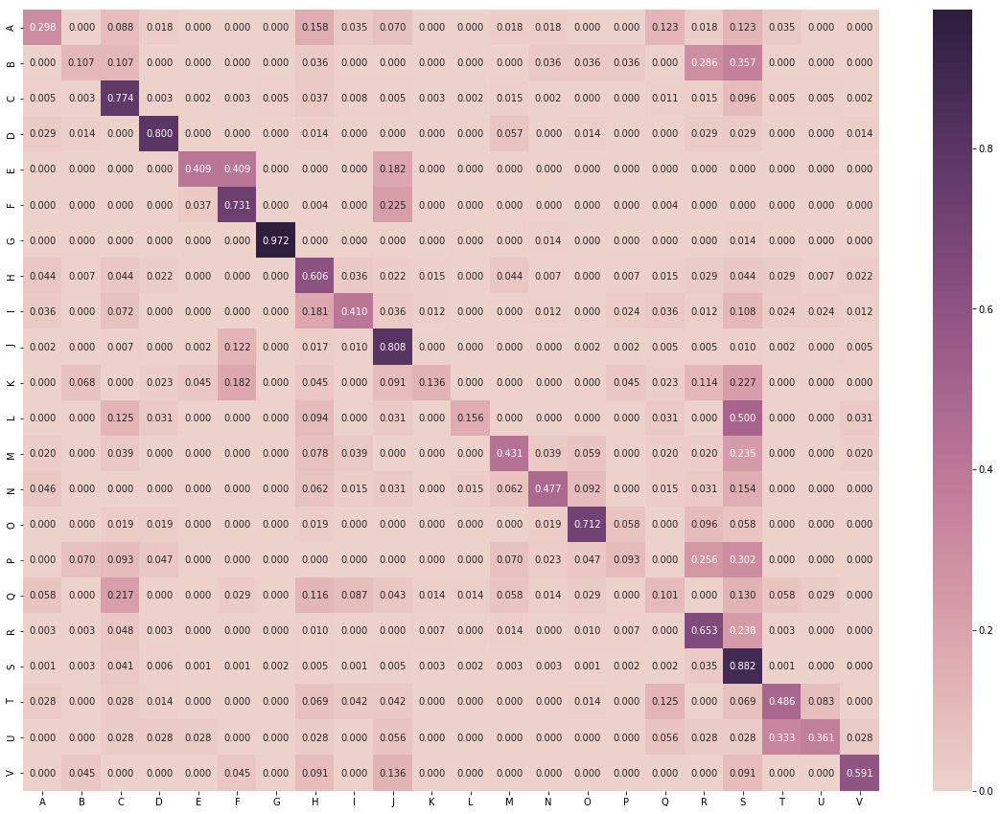

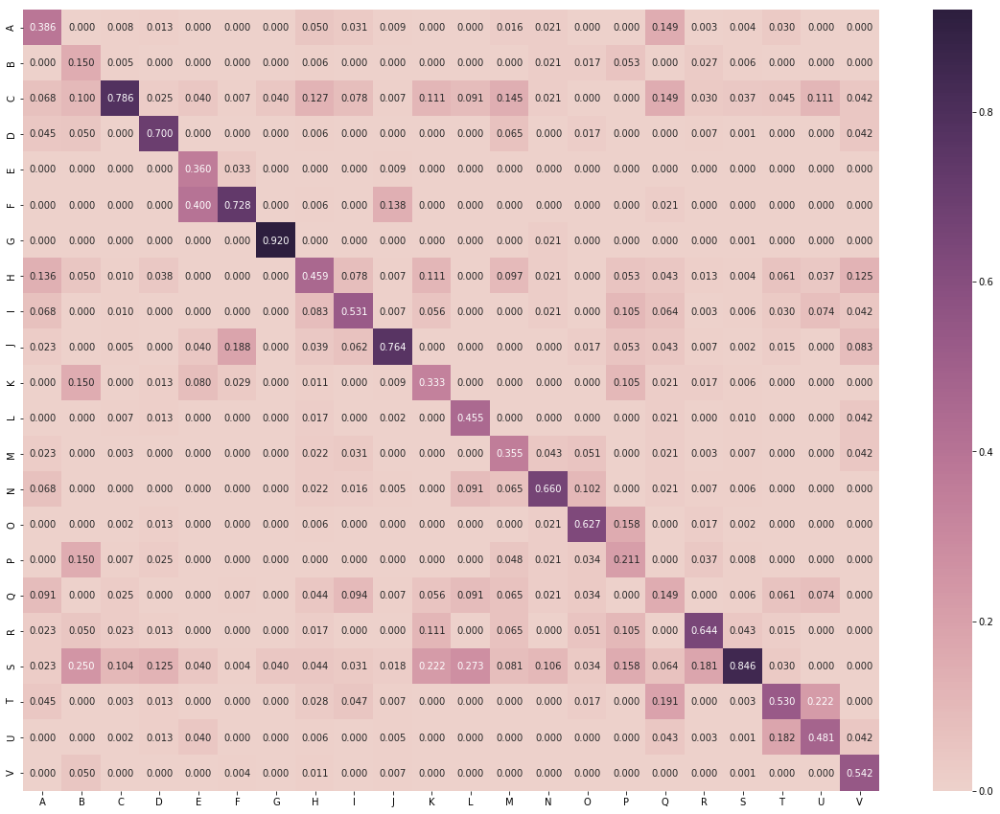

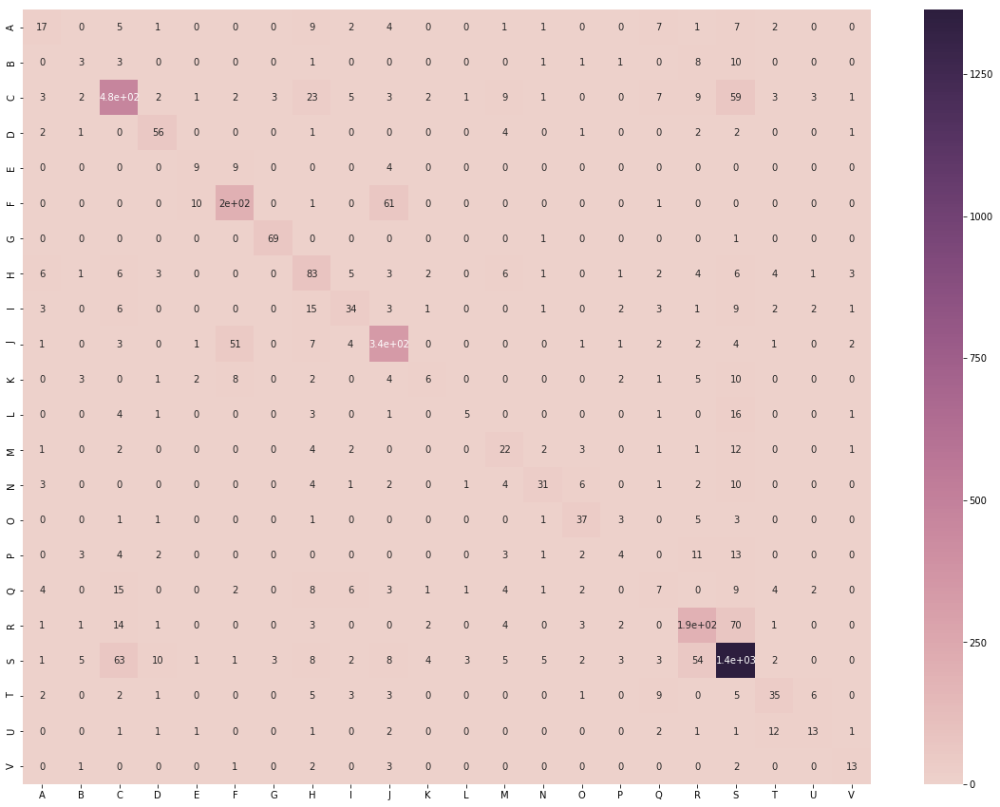

In [8]:
# Save minors
import pandas as pd
import seaborn as sn

V.put('cat_dic', cDic)
pickle.dump(conf_stack, open("{}/{}/{}_{}/confmat".format(os.getcwd(), "result", 
                                                      V.get('expTag'), V.get('expName')), 'wb'))
pickle.dump(V, open("{}/{}/{}_{}/information".format(os.getcwd(), "result", 
                                                      V.get('expTag'), V.get('expName')), 'wb'))

# Confusion matrix (column normalization)
conf_arr = test_conf
norm_conf = np.zeros((V.get('n_output'), V.get('n_output')))
for i in range(len(conf_arr)) :
    tmp_arr = conf_arr[i,:]
    a = np.sum(tmp_arr)
    if a != 0 :
        tmp_arr = tmp_arr.astype(np.float32)/a
    norm_conf[i,:] = tmp_arr
    
df_cm = pd.DataFrame(norm_conf, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUV"],
                     columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUV"])
plt.figure(figsize = (20,15))
cmap = sn.cubehelix_palette(8, as_cmap=True)
sn.heatmap(df_cm, annot=True, cmap=cmap, fmt='.3f')
plt.savefig("{}/{}/{}_{}/{}".format(os.getcwd(), "result", V.get('expTag'), V.get('expName'), "Conf_Col.png"))

# Confusion matrix (row normalization)
norm_conf = np.zeros((V.get('n_output'), V.get('n_output')))
for i in range(len(conf_arr)) :
    tmp_arr = conf_arr[:,i]
    a = np.sum(tmp_arr)
    if a != 0 :
        tmp_arr = tmp_arr.astype(np.float32)/a
    norm_conf[:,i] = tmp_arr
    
df_cm = pd.DataFrame(norm_conf, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUV"],
                     columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUV"])
plt.figure(figsize = (20,15))
cmap = sn.cubehelix_palette(8, as_cmap=True)
sn.heatmap(df_cm, annot=True, cmap=cmap, fmt='.3f')
plt.savefig("{}/{}/{}_{}/{}".format(os.getcwd(), "result", V.get('expTag'), V.get('expName'), "Conf_Row.png"))

# Confusion matrix (raw)
df_cm = pd.DataFrame(conf_arr.astype(int), index = [i for i in "ABCDEFGHIJKLMNOPQRSTUV"],
                     columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUV"])
plt.figure(figsize = (20,15))
cmap = sn.cubehelix_palette(8, as_cmap=True)
sn.heatmap(df_cm, annot=True, cmap=cmap)
plt.savefig("{}/{}/{}_{}/{}".format(os.getcwd(), "result", V.get('expTag'), V.get('expName'), "Conf.png"))

In [8]:
# Delete summary
os.system("rm -r -f {}/{}/{}".format(V.get('boardDir'), V.get('expTag'), V.get('expName')))

0

In [17]:
tf.reset_default_graph()

In [18]:
sess.close()

INFO:tensorflow:Error reported to Coordinator: <class 'tensorflow.python.framework.errors_impl.CancelledError'>, Enqueue operation was cancelled
	 [[Node: input_producer/input_producer/input_producer_EnqueueMany = QueueEnqueueManyV2[Tcomponents=[DT_INT32], timeout_ms=-1, _device="/job:localhost/replica:0/task:0/cpu:0"](input_producer/input_producer, input_producer/input_producer/RandomShuffle)]]


# Load Previous Model

In [114]:
saver = tf.train.import_meta_graph("{}/{}.meta".format(V.get('model_save_path'), "save-174000"))
saver.restore(sess, tf.train.latest_checkpoint(V.get('model_save_path')))
graph = tf.get_default_graph()
# corPred_test = graph.get_operation_by_name("AvgPred/corPred_test:0")
# test_acc = 0
# for i in range(test_set_size) :
#     test_acc_temp = sess.run(corPred_test, feed_dict={x:test_images[i], y:[test_labels[i]], cord:test_xys[i], phase:False})
#     for temp in test_acc_temp :
#         test_acc += int(temp)
# test_acc = test_acc/float(test_set_size)
# print test_acc

INFO:tensorflow:Restoring parameters from ./model/AttentionCNN_Cell/16.32.64.128.512.512_e003_AttFc2_Avg/save-186000


# Visualization

TI_YUSIL


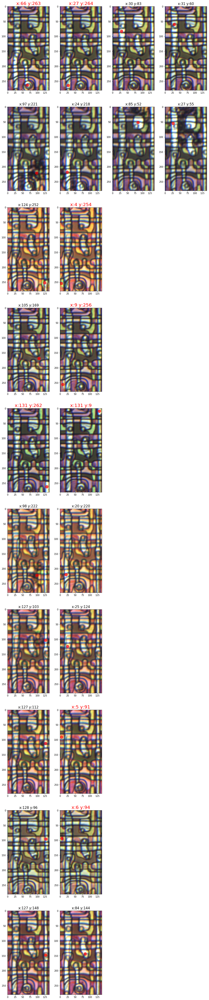

In [40]:
from matplotlib.patches import Circle
iter_num = 0
keys = sorted(cDic.keys())
vis_label = 21
vis_class = keys[vis_label]
vis_row = 10
vis_col = 5
vis_cnt = 0
y_gap = 20
x_gap = 10
print vis_class

perm = np.random.permutation(len(fList))
fig = plt.figure(figsize=(20,80))
# fig.suptitle("Class : {}".format(vis_class))
for i in range(len(fList)) :
    p = perm[i]
    if cList[p] == vis_label and len(fList[p]) > 1 :
        for j, f in enumerate(fList[p]) :
            if j+1 > vis_col :
                break
            y, x = xyList[p][j]
            ax = plt.subplot(vis_row, vis_col, vis_col*vis_cnt + j + 1)
            plt.imshow(ndimage.imread(f))
            if x < x_gap or x > 140 - x_gap or y < y_gap or y > 280 - y_gap :
                plt.title("x:{:d} y:{:d}".format(x, y), fontsize=20, color="r")
            else :
                plt.title("x:{:d} y:{:d}".format(x, y), fontsize=15)
#                 plt.axvspan(3, 6, color='red', alpha=0.5)
#                 plt.show()
            circ_r = Circle((x,y), 5, color='r', alpha=0.7)
            ax.add_patch(circ_r)
        vis_cnt += 1
        if vis_cnt >= vis_row :
            break
plt.savefig("{}/{}/{}_{}_{:d}".format(os.getcwd(), "analysis", "edgeError", vis_class, iter_num))

ValueError: num must be 1 <= num <= 25, not 26

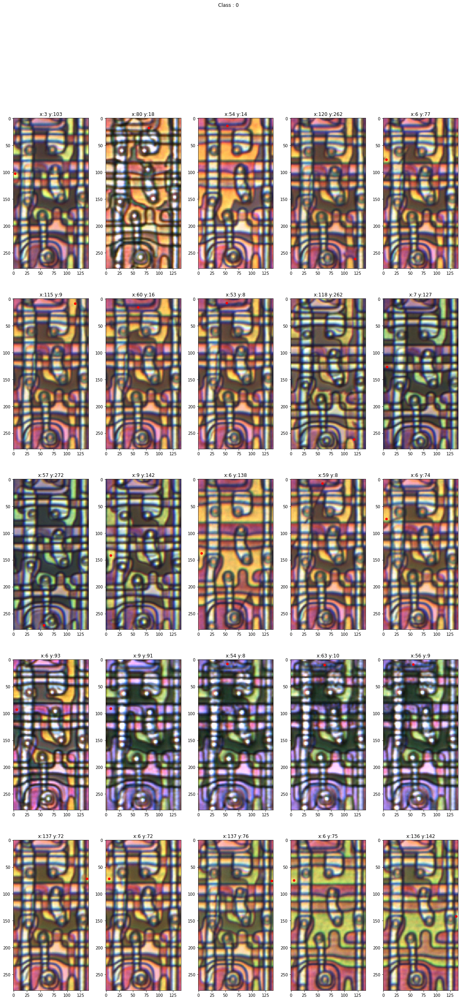

In [32]:
from matplotlib.patches import Circle
keys = cDic.keys()
print
vis_class = "ACT_HABU_PTN_ER"
vis_label = cDic[vis_class]
vis_row = 5
vis_col = 5
vis_cnt = 0
y_gap = 20
x_gap = 10
perm = np.random.permutation(len(fList))
fig = plt.figure(figsize=(20,40))
fig.suptitle("Class : {:d}".format(vis_label))
for i in range(len(fList)) :
    p = perm[i]
    if cList[p] == vis_label and len(fList[p]) > 1 :
        for j, f in enumerate(fList[p]) :
            y, x = xyList[p][j]
            if x < x_gap or x > 140 - x_gap or y < y_gap or y > 280 - y_gap :
                ax = plt.subplot(vis_row, vis_col, vis_cnt + 1)
                vis_cnt += 1
                plt.imshow(ndimage.imread(f))
                plt.title("x:{:d} y:{:d}".format(x, y))
                circ_r = Circle((x,y), 2, color='r')
                ax.add_patch(circ_r)
        if vis_cnt >= vis_row*vis_col :
            break
# plt.tight_layout()


In [8]:
print xyList[0]

[[250, 93], [7, 60]]


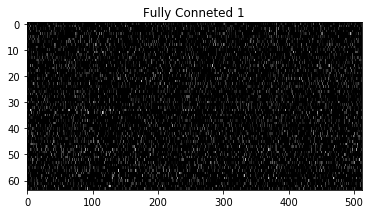

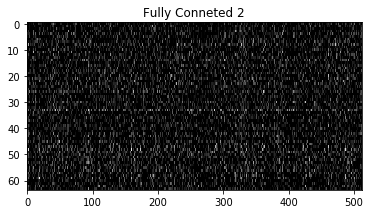

In [62]:
# Visualize activation
graph = tf.get_default_graph()
layer1 = graph.get_tensor_by_name("FC1/fc1:0")
layer2 = graph.get_tensor_by_name("FC2/fc2:0")
x_batch, y_batch = sess.run([train_image_batch, train_label_batch])

features1, features2 = sess.run([layer1, layer2], feed_dict={x:x_batch, phase:False, keep_prob:1})
# plt.imshow(features[0,:,:,0], cmap='gray')
# features = features.reshape(features.shape[0], features.shape[1]*features.shape[2]*features.shape[3])
plt.figure()
plt.imshow(features1, cmap='gray', aspect=4)
plt.title("Fully Conneted 1")

plt.figure()
plt.imshow(features2, cmap='gray', aspect=4)
plt.title("Fully Conneted 2")

In [58]:
print y_batch

[ 7 20 10 20 18 11 10 20 19 20 14 10  7  2 11  6  7  3 13  6  3  7  6  7 20
  3 18  2  7 14  7  7  7  7  0  6  2 13 11 12 19 17 20  7  8 12 16 11  6  3
 13  3  7 18 18  3  7  0 20 17  7  8  7 15]


(3, 3, 3, 16)


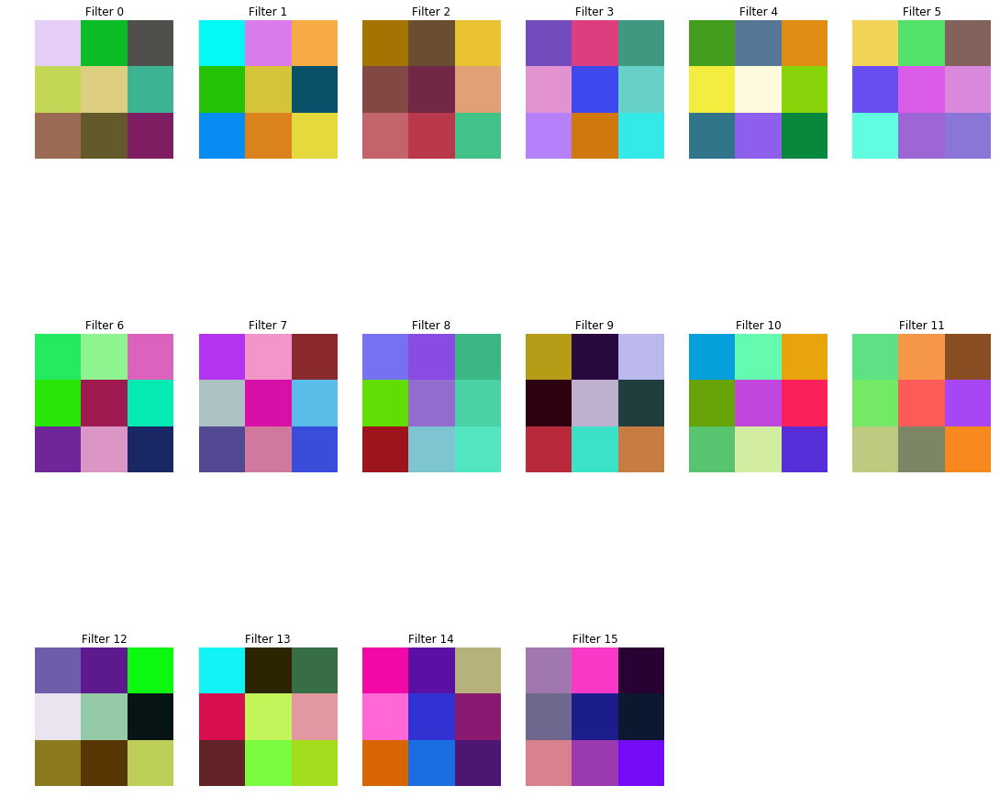

In [75]:
# Visualize filter weigth
graph = tf.get_default_graph()
w = graph.get_tensor_by_name("Weight/w_c1_1:0")
# x = np.zeros((280,140,3))
# cord = 
print w.shape
w = sess.run(w)
# plt.figure(1)
plotNNFilterRGB(w)
w = w[:,:,0,:]
# w = w.reshape(w.shape[0], w.shape[1], w.shape[2]*w.shape[3])
# plt.figure(2)
# plotNNFilter(w)
plt.tight_layout()

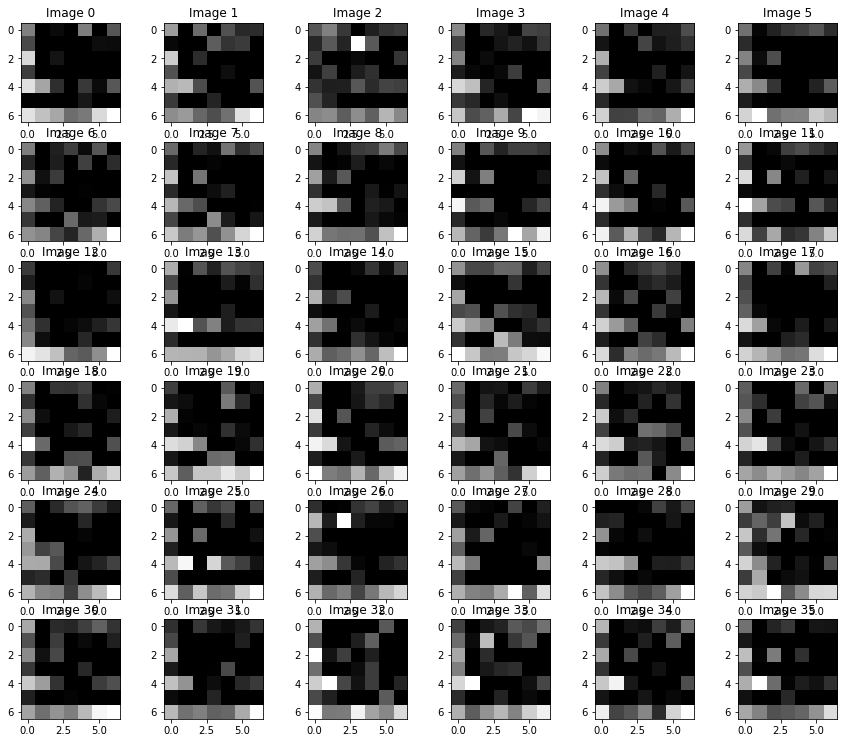

In [99]:
# VIsualize filter output
graph = tf.get_default_graph()
conv1 = graph.get_tensor_by_name("Half/pool4:0")
x_batch, y_batch = sess.run([train_image_batch, train_label_batch])

features1 = sess.run(conv1, feed_dict={x:x_batch, phase:False, keep_prob:1})
# plt.imshow(features[0,:,:,0], cmap='gray')
# features = features.reshape(features.shape[0], features.shape[1]*features.shape[2]*features.shape[3])
filter_id = np.random.randint(features1.shape[3])
features1 = features1[:36,:,:,filter_id]
plotNNOutput(features1)

In [46]:
cnt = np.zeros((22,4), dtype=np.int32)
test_a = 0
test_b = 0
for i in range(len(fList)) :
    l = len(fList[i])
    if l >= 4 :
        l = 4
    c = cList[i]
    cnt[c,l-1] += 1
print cnt

[[  375    49    14    55]
 [  155    73    12    15]
 [ 4196   317    16    19]
 [   67   177    94   158]
 [   22   108    52    55]
 [ 1756   319    30     5]
 [  363    90    36    34]
 [  898   244    40    78]
 [  552   130    23    29]
 [ 3035   105    10    27]
 [  155   122    28    64]
 [  225    42     6     5]
 [  131   160    57    94]
 [  151   142    47    98]
 [    7    76    45   247]
 [  134   121    27    26]
 [  514    45     5     3]
 [ 1454   794    44    27]
 [10580  1111    76    54]
 [  233   191    46    81]
 [   95   119    18    45]
 [  129    37     5    10]]


In [85]:
print len(features1)

1


In [14]:
xys_arr = []
y_arr = []
for i in range(len(xyList)) :
    xys_arr.extend(xyList[i])
    y_arr.extend([cList[i]]*len(xyList[i]))
xys_arr = np.array(xys_arr)
y_arr = np.array(y_arr)
print len(xys_arr), len(y_arr)

44395 44395


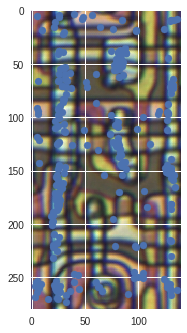

In [24]:
template = ndimage.imread("/root/data/Template3.bmp")
plt.imshow(template)
plt.scatter(xys_sel[:,1], xys_sel[:,0])

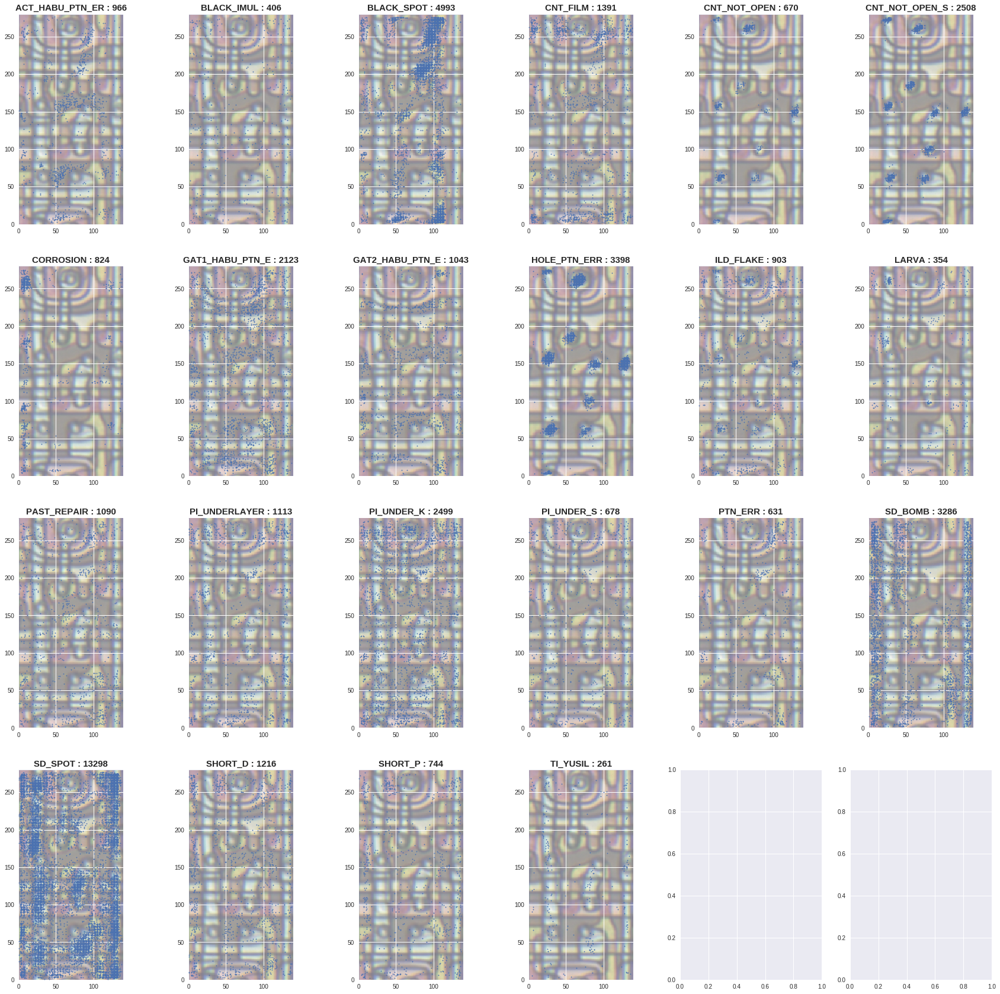

In [41]:
import seaborn as sns
import operator
from scipy.misc import imresize
template = ndimage.imread("/root/data/Template3.bmp")
# template = imresize(template, (128,128))
fig, ax = plt.subplots(4, 6, figsize=(30, 30))
sorted_cDic = sorted(cDic.items(), key=operator.itemgetter(1))
for c in range(22) :
    xys_sel = np.squeeze(xys_arr[np.where(y_arr == c), :])
    ax[c/6,c%6].imshow(template, alpha=0.5)
    ax[c/6,c%6].scatter(xys_sel[:,1], xys_sel[:,0], s=2)
    ax[c/6,c%6].set_xlim(0,140)
    ax[c/6,c%6].set_ylim(0,280)
#     st = fig.suptitle("askdjf", fontsize="x-large")
    title = "{} : {:d}".format(sorted_cDic[c][0], len(xys_sel))
    ax[c/6,c%6].set_title(title, fontweight="bold", fontsize=15)

In [132]:
img = np.ones((1,280,140,3))
# graph = tf.get_default_graph()
fc1 = graph.get_tensor_by_name("FC1/fc1:0")
# x = graph.get_operation_by_name("x")
test = sess.run(fc1, feed_dict={'x_1:0':img, 'phase_1:0':False})
print test.shape

(1, 512)


In [ ]:
sess = tf.Session(config=tf.ConfigProto(gpu_options=tf.GPUOptions(allow_growth=True)))

coord = tf.train.Coordinator()
threads = tf.train.start_queue_runners(coord=coord, sess=sess)

sess.run(tf.global_variables_initializer())
sess.run(tf.local_variables_initializer())

x_batch, y_batch = sess.run([train_image_batch, train_label_batch])
# y_batch = sess.run([train_label_batch])
result = sess.run(x_std, feed_dict={x:x_batch})
print plt.imshow(result[3].astype(np.uint8))

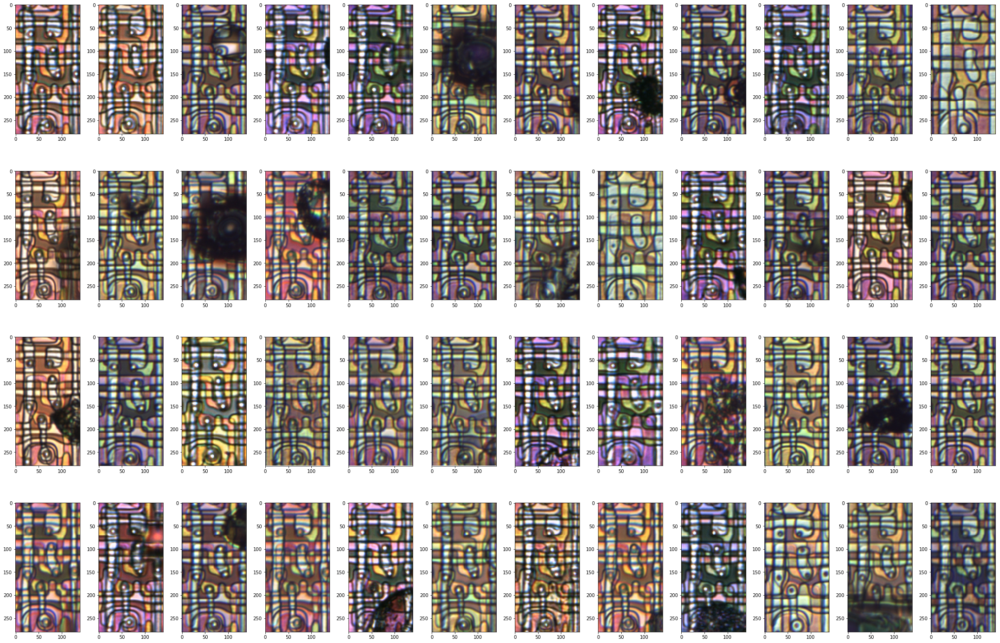

In [6]:
# visualize
visual_cat = "PI_UNDER_K"
fig, ax = plt.subplots(4, 12, figsize=(30, 20))
idxs = np.random.permutation(len(fList))
m = 0
for i in range(4):
    for j in range(12):
        while(cList[idxs[m]] != cDic[visual_cat]) :
            m += 1
#         n = 12*i + j
        f = fList[idxs[m]][0]
#         print cList[idxs[n]]
        ax[i,j].imshow(ndimage.imread(f))
        m += 1
plt.tight_layout()

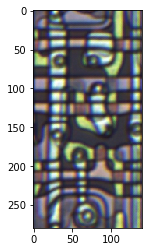

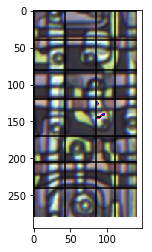

In [77]:
# visualize griding
i = np.random.randint(len(fList))
f = fList[i][0]
xy = xyList[i][0]
# x_grid_std = range(0,141,20)
# x_grid_std = [0, 18, 42, 58, 82, 110, 140]
x_grid_std = [0, 42, 85, 110, 140]
# y_grid_std = range(0,281,20)
y_grid_std = [0, 40, 80, 120, 170, 205, 240, 280]
img = ndimage.imread(f)
plt.figure(1)
plt.imshow(img)
img[y_grid_std[xy[0]]:y_grid_std[xy[0]+1], x_grid_std[xy[1]]:x_grid_std[xy[1]+1], :] += 20
plt.figure(2)
plt.imshow(img)
for std in x_grid_std[:-1] :
    plt.vlines(std, 0, 280)
for std in y_grid_std[:-1] :
    plt.hlines(std, 0, 140)

In [57]:
print img.shape

(280, 140, 3)


In [36]:
cnt = np.zeros(70, dtype=np.int32)
test_a = 0
test_b = 0
for i in range(test_set_size) :
    l = len(test_images[i])
    cnt[l] += 1*l
    test_a += 1
print cnt
print np.sum(cnt[2:])

[   0 2415  930  225  228   95   90   56   24    0   60   11    0    0   14
    0   16   17    0    0    0    0    0    0    0    0   26    0    0    0
   30    0    0    0    0   35    0   37    0    0    0   41    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]
1935
